**<font color=black size=5 face=Georgia>A Brief Analysis about Missing Migrants</font>**

*by Wang Minghao, Cheng Yu, Liu Zhaoxing, Wang Yanwen*  
**@ AI & Digital Media, HKBU**

<font color=black size=3 face=Georgia>In this project, we’re going to analyze Missing Migrants case.</font>

<font color=black size=3 face=Georgia>After the United Nations set up an international convention about refugees in 1951, different organization focused more on problems of migrants and refugees. During 2015 and 2016, over one million seekers and refugees in Germany had major social consequences and gave rise to extensive debates about the nature of cultural diversity and collective life. Trump’s administration started to practice “Zero Tolerance of Refugees” early 2018 after decreased refugees’ production step by step. Through the worldwide, although UNHCR has helped 5 billion start new lives, there are also more than 6.5 billion refugees displaced. What’s worse, some of them died while escaping or killed.</font>

<font color=black size=3 face=Georgia>So, it concerns us that how many people are still displaced especially because of wars or flus? And how do they travel? What kind of danger that they might encounter on their way?</font>

<font color=black size=3 face=Georgia>We hope to rise people’s awareness of that there are still many people struggling for living, at least to let our classmates know more about these people. What’s more, after analyzing the country, time and location of accidents, we wish to help the related organization save more lives.</font>

### MIT License
<font color=black size=2 face=Calibri>
**Copyright (c) 2019 tudousponge**

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.</font>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import geopandas as gpd
from shapely.geometry import Point
import fiona
from fiona.crs import from_epsg,from_string
from folium import plugins
%matplotlib inline

OSError: [WinError 126] The specified module could not be found

In [2]:
path = '../data/'
data = pd.read_csv(path + 'MissingMigrants-Global-2019-12-06T12-34-22.csv')
'MissingMigrants-Global-2019-12-06T12-34-22.csv'
'MissingMigrants-Global-2019-12-06T12-34-22.csv'
data

,Web ID,Region of Incident,Reported Date,Reported Year,Reported Month,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Location Description,Information Source,Location Coordinates,Migration Route,URL,UNSD Geographical Grouping,Source Quality
0,52638,Sub-Saharan Africa,"December 04, 2019",2019,Dec,58.0,NaN,58,83.0,NaN,NaN,NaN,Drowning,"Off the coast of Nouadhibou, Mauritania - boat...",IOM Mauritania,"20.994842600000, -17.008374800000",Western African,http://bit.ly/2LpoJMV,Western Africa,4
1,52637,US-Mexico Border,"December 02, 2019",2019,Dec,1.0,NaN,1,NaN,NaN,1.0,NaN,Drowning,"Río Bravo, near La Playita, Ejido Reynosa Díaz...","La Tarde, El Mañana","26.036051500000, -98.288571400000",NaN,"http://bit.ly/38ihiAW, http://bit.ly/2PeMeZV",Central America,3
2,52633,Mediterranean,"November 28, 2019",2019,Nov,NaN,3.0,3,NaN,NaN,NaN,NaN,Presumed drowning,Unspecified location off the coast of Libya (r...,IOM Libya,"32.906561900000, 13.258396700000",Central Mediterranean,NaN,Uncategorized,4
3,52636,Europe,"November 28, 2019",2019,Nov,2.0,NaN,2,NaN,NaN,NaN,NaN,Vehicle accident,"Ljubljana-Koper motorway, near the town of Vrh...","Slovenian Police via IOM Slovenia, Total Slove...","45.967034400000, 14.298533000000",NaN,"http://bit.ly/2LqJ04q, https://bit.ly/2L59hoU,...",Southern Europe,5
4,52630,Mediterranean,"November 26, 2019",2019,Nov,4.0,19.0,23,58.0,NaN,NaN,NaN,Drowning,"30 miles off the coast of Melilla, Spain",Caminando Fronteras,"35.292869500000, -2.925263900000",Western Mediterranean,"http://bit.ly/2XRlNgN, http://bit.ly/2KZKjqV, ...",Uncategorized,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6199,39207,US-Mexico Border,"January 16, 2014",2014,Jan,1.0,NaN,1,NaN,NaN,1.0,NaN,Shot,"near Douglas, Arizona",Ministry of Foreign Affairs Mexico,"31.344700000000, -109.545000000000",Central America to US,http://bit.ly/1qfIw00,Northern America,5
6200,39368,Europe,"January 16, 2014",2014,Jan,1.0,0.0,1,2.0,NaN,1.0,NaN,Hyperthermia,Border between Russia and Estonia,EUBusiness (Agence France-Presse),"59.155100000000, 27.858600000000",NaN,http://bit.ly/1rTFTjR,Northern Europe,1
6201,39257,US-Mexico Border,"January 14, 2014",2014,Jan,1.0,NaN,1,NaN,NaN,NaN,NaN,Unknown (skeletal remains),Pima County,Pima County Office of the Medical Examiner,"32.058118300000, -111.623576100000",Central America to US,NaN,Northern America,5
6202,39256,US-Mexico Border,"January 12, 2014",2014,Jan,1.0,NaN,1,NaN,NaN,NaN,NaN,Unknown (skeletal remains),Pima County,Pima County Office of the Medical Examiner,"32.058118300000, -111.623576100000",Central America to US,NaN,Northern America,5


In [3]:
TotalDeadMissing = []
for ele in data['Total Dead and Missing'] :
    TotalDeadMissing.append(ele.replace(',',''))  # To replace "," in numbers like 1,234 -> 1234
    
data['Total Dead and Missing'] = TotalDeadMissing
data['Total Dead and Missing'] = pd.to_numeric(data['Total Dead and Missing'])

<font color=black size=5 face=Georgia>Scatter Plot: Year-Region-Dead Number</font>  
*by* Wang Minghao

<font color=black size=3 face=Georgia>Generally speaking, migrants’ separation is dynamic and situations in different regions are quite various from each other. To figure out the separation in different time and regions, we tried to build small multiple scatter plots. Since we have “time”, “region” and “migrant amount” three dimensions, we have to reduce dimension at first.</font>

In [4]:
regions = data.groupby('Region of Incident').size()
regions

Region of Incident
Caribbean               68
Central America        358
Central Asia             1
East Asia                5
Europe                 298
Horn of Africa         241
Mediterranean         1078
Middle East            183
North Africa          1394
North America            2
South America           36
South Asia             183
Southeast Asia         140
Sub-Saharan Africa     623
US-Mexico Border      1594
dtype: int64

<font color=black size=3 face=Georgia>After reading data from csv file, which is roughly cleaned by the author, we use ‘DataFrame.groupby’ to group original data frame by ‘Region of Incident’. Then we designed a pivot table to sum missing migrant amount in different years and regions. In this pivot table, we replace null value using 0, that’s because after checking some other projects we think this dataset have all big events observed.</font> 

In [5]:
sum_by_year = pd.pivot_table(data, index = ['Region of Incident'], values = ['Total Dead and Missing'], columns = ['Reported Year'], aggfunc = [np.sum],fill_value = 0)
# , fill_value = 'None'

print(sum_by_year.columns)
print(sum_by_year.index)
print(sum_by_year.head(2))
sum_by_year

MultiIndex([('sum', 'Total Dead and Missing', 2014),
            ('sum', 'Total Dead and Missing', 2015),
            ('sum', 'Total Dead and Missing', 2016),
            ('sum', 'Total Dead and Missing', 2017),
            ('sum', 'Total Dead and Missing', 2018),
            ('sum', 'Total Dead and Missing', 2019)],
           names=[None, None, 'Reported Year'])
Index(['Caribbean', 'Central America', 'Central Asia', 'East Asia', 'Europe',
       'Horn of Africa', 'Mediterranean', 'Middle East', 'North Africa',
       'North America', 'South America', 'South Asia', 'Southeast Asia',
       'Sub-Saharan Africa', 'US-Mexico Border'],
      dtype='object', name='Region of Incident')
                                      sum                         
                   Total Dead and Missing                         
Reported Year                        2014 2015 2016 2017 2018 2019
Region of Incident                                                
Caribbean                              73 

sum                              
                   Total Dead and Missing                              
Reported Year                        2014  2015  2016  2017  2018  2019
Region of Incident                                                     
Caribbean                              73    68   115   170    41   160
Central America                       116   110   180    93    77   104
Central Asia                            0     0     0     0    52     0
East Asia                               9    15     3     1     3     0
Europe                                 22   137    63    98   116   116
Horn of Africa                        265   135   235   173   276    99
Mediterranean                        3283  4054  5143  3139  2299  1235
Middle East                            41    14   100    98   145   103
North Africa                           90   825  1504  1013   734   320
North America                           0     0     0     1     0     1
South America                           0     2    33     0    30    37
South Asia                              2    22    14   221    27   111
Southeast Asia                        814   789   187   301   105   143
Sub-Saharan Africa                    268    74    92   554   590   319
US-Mexico Border                      306   339   401   417   442   350

<font color=black size=3 face=Georgia>Here, it’s a bit tricky that when we try to get one column from a pivot table which has been folded (such as ‘Reported Year’), we have to call function ‘pivot_table.columns.get_level_values’.</font>

In [6]:
sum_by_year.columns.names=['Sum','Total Dead and Missing','Reported Year']
x = sum_by_year.columns.get_level_values('Reported Year')
x

Int64Index([2014, 2015, 2016, 2017, 2018, 2019], dtype='int64', name='Reported Year')

In [7]:
y = sum_by_year.values
y

array([[  73,   68,  115,  170,   41,  160],
       [ 116,  110,  180,   93,   77,  104],
       [   0,    0,    0,    0,   52,    0],
       [   9,   15,    3,    1,    3,    0],
       [  22,  137,   63,   98,  116,  116],
       [ 265,  135,  235,  173,  276,   99],
       [3283, 4054, 5143, 3139, 2299, 1235],
       [  41,   14,  100,   98,  145,  103],
       [  90,  825, 1504, 1013,  734,  320],
       [   0,    0,    0,    1,    0,    1],
       [   0,    2,   33,    0,   30,   37],
       [   2,   22,   14,  221,   27,  111],
       [ 814,  789,  187,  301,  105,  143],
       [ 268,   74,   92,  554,  590,  319],
       [ 306,  339,  401,  417,  442,  350]], dtype=int64)

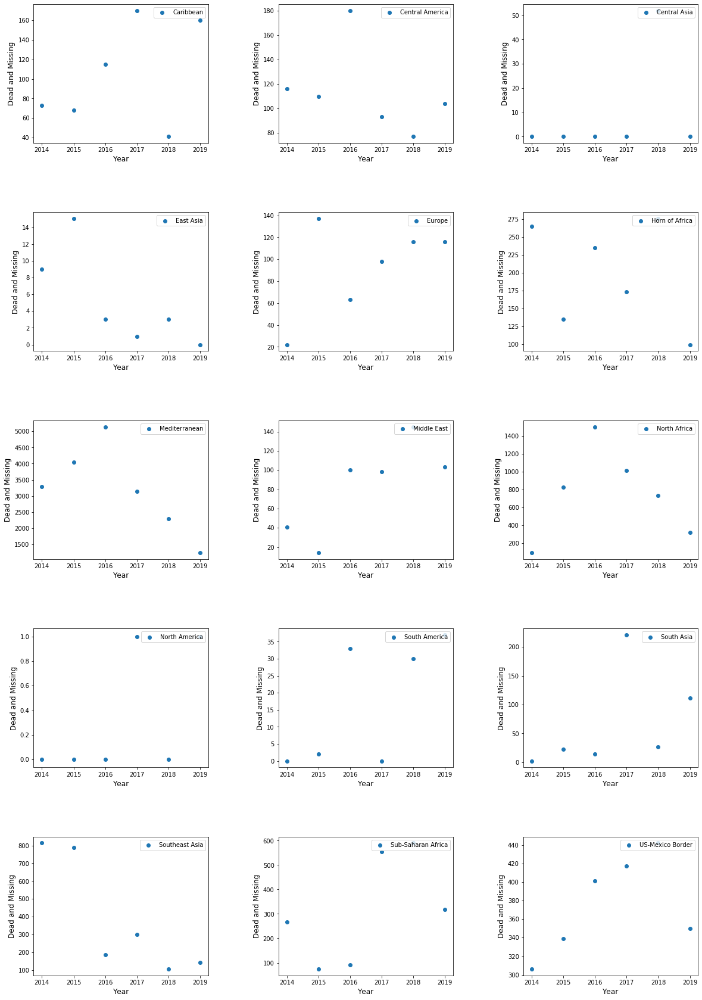

In [8]:
fig = plt.figure(figsize=(20,30))
fig.subplots_adjust(hspace=0.5, wspace=0.4)
# distance between plots

n = 1
i = 0
for region in regions.index:
    ax = fig.add_subplot(5,3,n) 
    # 5rows, 3columns, No.n
    ax.scatter(x,y[i])
    ax.set_xlabel('Year',fontsize = 12)
    ax.set_ylabel('Dead and Missing',fontsize = 12)
    ax.legend([region],loc = 'upper right')
    n += 1
    i += 1

plt.show()

In [13]:
x_list = x.tolist()
y_list = y.tolist()

peak_year = []
for item in y_list:
    peak_year.append(x[item.index(max(item))])

peak_count = []
for year in x:
    peak_count.append(peak_year.count(year))

print(peak_year)
print(peak_count)
peak_freq = zip(x_list, peak_count)
peak_df = pd.DataFrame(list(peak_freq)).reset_index(drop=True)
#peak_df.to_string(index = False)
peak_df.columns = ['Peak Value Year', 'Frequency']
peak_df

[2017, 2016, 2018, 2015, 2015, 2018, 2016, 2018, 2016, 2017, 2019, 2017, 2014, 2018, 2018]
[1, 2, 3, 3, 5, 1]


,Peak Value Year,Frequency
0,2014,1
1,2015,2
2,2016,3
3,2017,3
4,2018,5
5,2019,1


<font color=black size=3 face=Georgia>As you can see from these plots, we have 15 different regions in all. There is one region seems so peace that there is always no ‘Dead and Missing’ except 2018. While some regions’ value is always high during 2014 to 2019, such as ‘Mediterranean’, ‘North Africa’ and ‘US-Mexico Border’. When we think about the peak value of each region, we can tell that 2018 has 5 peak values which is the most among these years.However, we can’t find some universal trend from these scatter plots because values are quite ‘scattered’.</font>

<font color=black size=5 face=Georgia>Bar Chart: Gender-Age-Migrants Number</font>  
*by* Wang Yanwen

<font color=black size=3 face=Georgia>In this part, we aim to analyze the gender and age of migrants in the datasets. Since we want to compare the number of people of different genders and ages, and bar charts can display and compare the number clearly, we choose the bar chart for visualizing.</font>

In [10]:
from numpy import array
from matplotlib import cm
from bokeh.plotting import figure,show
from bokeh.models import ColumnDataSource

<font color=black size=3 face=Georgia>In the first step, because the dataset already has columns for the number of women, the number of men and the number of children, so we use the ‘sum’ function to clean the dataset and group by Reported Year so that we get the total number of males, females and children per year. </font>

In [11]:
data2=data.groupby('Reported Year').sum()
data2

,Web ID,Number Dead,Minimum Estimated Number of Missing,Total Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Source Quality
Reported Year,,,,,,,,,
2014,9766468,1726.0,3563.0,5289,5553.0,54.0,204.0,300.0,827
2015,32943987,4045.0,2539.0,6584,8115.0,216.0,797.0,291.0,2284
2016,54925720,4059.0,4011.0,8070,17407.0,282.0,890.0,268.0,3367
2017,53418250,3734.0,2545.0,6279,6424.0,547.0,1613.0,308.0,4075
2018,78651433,3234.0,1703.0,4937,9273.0,725.0,1817.0,418.0,4640
2019,46347451,2029.0,1069.0,3098,4383.0,408.0,934.0,237.0,2785


<font color=black size=3 face=Georgia>Then to make the bar chart can be customized using keyword arguments, we import plotly.express and plotly.graph_objects to make bar chart.   
Finally, we draw the bar chart make the year as the independent variable and the number of people as the dependent variable. Since some migration events in the datasets do not record gender and age, we only compare the data recorded.</font>

In [11]:
import plotly.express as px
import plotly.graph_objects as go

In [12]:
ReportYear = ['2014', '2015', '2016', '2017', '2018', '2019']

fig = go.Figure()
fig.add_trace(go.Bar(
    x=data2.index,
    y=data2['Number of Females'],
    name='Females',
    marker_color='indianred'
))
fig.add_trace(go.Bar(
    x=data2.index,
    y=data2['Number of Males'],
    name='Males',
    marker_color='lightsalmon'
))
fig.add_trace(go.Bar(
    x=data2.index,
    y=data2['Number of Children'],
    name='Children',
    marker_color='lightcoral'
))
# Here we modify the tickangle of the xaxis, resulting in rotated labels.
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

<font color=black size=3 face=Georgia>According to the bar chart, we can see that, except for 2014, the number of male migrants has been the highest from 2015 to 2019, especially the number of male migrants reached 1817 in 2018. During these five years the number of men has been roughly three times that of women and children. The number of women and children also reached their highest points in 2018, with figures of 725 and 418, respectively. From 2014 to 2019, the number of women was the lowest in 2014, only 54, and the number of children reached the lowest in 2019, with 237.</font>

<font color=black size=5 face=Georgia>Bar Chart: Monthly Dead Number</font>  
*by* Liu Zhaoxing

<font color=black size=3 face=Georgia>In this part, we are focusing on the number of migrants' death and missing in each month during 2014-2019. The unit here is the total number of death and missing and reported month and year. However, the number of total death and missing is not stored in numeric way in the data frame, and it is object type, instead. So we have to transfer it into numeric way to make it accessible to plot function. Since pd.to_numeric() function can not recognize ',' between numbers, like 1,234. Data cleaning is required here, so we use str.replace() to remove ',' and then turn the data into numeric type. Then here come the results.</font>

In [13]:
MigDeath = data.groupby(by = ["Reported Month","Reported Year"]).sum()#[["Minimum Estimated Number of Missing",'Total Dead and Missing','Number of Survivors','Number Dead']]
MigDeath.to_csv('brige.csv')  # A robust way to change inex
MigDeath = pd.read_csv('brige.csv')

In [14]:
# To transfer Month into numbers in order to sort easily
MonList = []
for index,row in MigDeath.iterrows():
    if row['Reported Month'] == 'Jan':
        MonList.append(1)
    elif row['Reported Month'] == 'Feb':
        MonList.append(2)
    elif row['Reported Month'] == 'Mar':
        MonList.append(3)
    elif row['Reported Month'] == 'Apr':
        MonList.append(4)
    elif row['Reported Month'] == 'May':
        MonList.append(5)
    elif row['Reported Month'] == 'Jun':
        MonList.append(6)
    elif row['Reported Month'] == 'Jul':
        MonList.append(7)
    elif row['Reported Month'] == 'Aug':
        MonList.append(8)
    elif row['Reported Month'] == 'Sep':
        MonList.append(9)
    elif row['Reported Month'] == 'Oct':
        MonList.append(10)
    elif row['Reported Month'] == 'Nov':
        MonList.append(11)
    elif row['Reported Month'] == 'Dec':
        MonList.append(12)
    else:
        continue
        
MigDeath['NumMonth'] = MonList
MigDeath = MigDeath.sort_values(by = 'NumMonth')

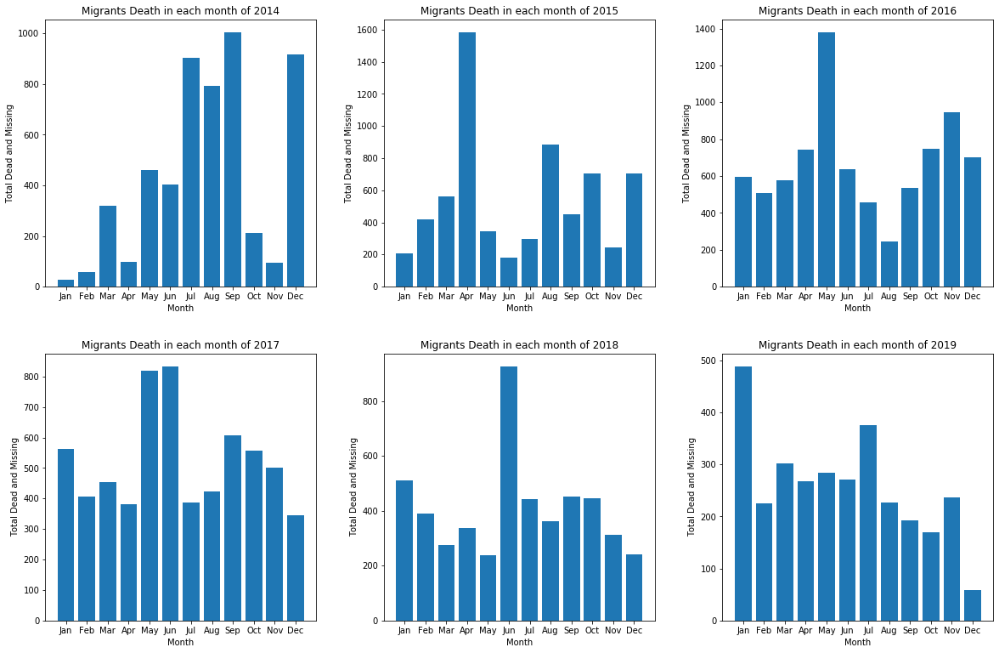

In [15]:
MigDeath_Draw = MigDeath.groupby(by = 'Reported Year').size()

fig = plt.figure(figsize=(20,13)) #create a new figure 
fig.subplots_adjust(hspace=0.25,wspace = 0.25)  # gaps between the figures 
n = 1 
for year in MigDeath_Draw.index:
    ax = fig.add_subplot(2,3,n)
    ax.set_title('Migrants Death in each month of ' + str(year))
    x = MigDeath[MigDeath['Reported Year'] == year]['Reported Month']
    y = MigDeath[MigDeath['Reported Year'] == year]['Total Dead and Missing']
    ax.bar(x,y)
    ax.set_xlabel('Month')
    ax.set_ylabel('Total Dead and Missing')
    DeathMean = y.mean()
    ax.axhline(DeathMean)
    #plt.xticks(rotation = 90) 
    n += 1

plt.show()

<font color=black size=3 face=Georgia>As can be seen in these charts, in 2014, Jul, Aug, Sep and Dec had the highest number of migrants having deadly accidents, reaching almost 1 thousand per month. The next year, in 2015, things were a lot different. April had the highest number, reaching 1600, and in other months, migrants were not that frequently to have fatal accidents. The situation went similar in 2016, migrants died intensively in May, and other month were also full of migrant-tragedies. People were still emigrating to other countries during 2017, with lower dead and missing number. Things went better in 2018 and 2019. The average number of dead and missing migrants went down in these two years, and the highest number in 2019 is much lower than that of 2015.  
In average, average numbers of dead and missing migrants each year went up from 2014 to 2016, and then went down from 2016 to 2019. It shows that maybe there was something happening to influence migrants' motivation to move from their motherland to other counties but we still don't know yet. We may figure it out in our future research.</font>

<font color=black size=5 face=Georgia>Table & Funnel: Cause of Death-Dead Number</font>  
*by* Cheng Yu 

<font color=black size=3 face=Georgia>In this part, we aim to do some visualization about dead number with different causes. </font>

In [16]:
Migrants = data.copy()

In [17]:
table1 =pd.pivot_table(Migrants, values='Number Dead', index=['Cause of Death'], columns=['Reported Year'], aggfunc={'Number Dead': np.mean})

<font color=black size=3 face=Georgia>Firstly, we still do some data cleaning and screening. Using ‘sum’ function to calculate the total number of death group by causes （table_sum1）.  Since this part includes two variables, so table is a proper method. </font>

In [18]:
table_sum=Migrants.groupby('Cause of Death')['Number Dead'].sum()
table_sum1=pd.DataFrame(table_sum)
table_sum1.head(10)

,Number Dead
Cause of Death,
Accident (non-vehicle),3.0
Air strike,10.0
Asphyxiation,73.0
"Asphyxiation, Drowning",3.0
Attacked by Apache helicopter,42.0
Burned,16.0
"Burned, Drowning",17.0
Bus fire,52.0
Cardiac arrest,23.0


<font color=black size=3 face=Georgia>Based on table_sum1, using ‘sort’ function to set values of number in sequences and store top 10 in table-Cause_top. In this case, we can directly see, what caused the most deaths is drowning, the number of which is almost 6700. The other causes result in number dead lower than 2000, such as sickness ( including lack of access to medicines), vehicle accident and other unknown reasons. The last items in this table cause death number lower than 1000.</font>

In [19]:
table_cause=table_sum1.sort_values('Number Dead', ascending=False)
Cause_top=table_cause.head(10)
Cause_top

,Number Dead
Cause of Death,
Drowning,6663.0
Sickness and lack of access to medicines,1843.0
Vehicle Accident,1529.0
Unknown,1292.0
Presumed drowning,1003.0
Mixed,726.0
Unknown (skeletal remains),517.0
Shot,414.0
Dehydration,406.0


In [20]:
import pyecharts
from pyecharts import Funnel

In [21]:
attr =["Drowning", "Sickness and lack of a access to medicines", "Vehicle Accident", "Unknow", "Presumed drowning", "Mixed","Unknown(skeletal remains)", "Shot", "Dehydration", "Stavation"]
values =[6227, 1742, 1208, 1189, 963, 726, 474, 391, 347, 330]
print(attr)
print(values)
funnel1 = Funnel('Cause--Number Dead', title_pos='center')
funnel1.add(name='Cause of Death',  # name of the fig
            attr=attr,  
            value=values,  
            is_label_show=True,  # make sure of the abbel
            label_formatter='{c}'+'%',  # set up the function
            legend_top='bottom',    # set up the position
          
            label_pos='outside',  
            legend_orient='vertical',  
            legend_pos='right')  

funnel1.render('funnel_cause_amount.html')

['Drowning', 'Sickness and lack of a access to medicines', 'Vehicle Accident', 'Unknow', 'Presumed drowning', 'Mixed', 'Unknown(skeletal remains)', 'Shot', 'Dehydration', 'Stavation']
[6227, 1742, 1208, 1189, 963, 726, 474, 391, 347, 330]


**To view this funnel, please turn to *funnel_cause_amount.html***

<font color=black size=3 face=Georgia>To make the results more visible, it’s better to draw an interaction diagram. We plan to use the function ‘Funnel’ of pyecharts to draw a funnel diagram. After setting the data of Cause_top as the input and adjusting other parameters, we get a funnel pic as the result. In this diagram, we are closer to the data and it’s easy to see the difference by the area size.</font>

<font color=black size=5 face=Georgia>Map: Region-Cause of Death-Dead Number</font>  
*by* All group members

<font color=black size=3 face=Georgia>After drawing these plots like scatter plot and bar chart, we want to do something different. We think the distribution around the world is not intuitive enough. So we tried to build a world map contains both ‘Cause of Death’ and ‘Dead Number’. </font>

In [23]:
# To make one colomn of variables,which is 'Total Dead and Missing',back to object type
data = pd.read_csv('../data/' + 'MissingMigrants-Global-2019-12-06T12-34-22.csv') 

<font color=black size=3 face=Georgia>About data pre-processing, since the values of latitude and longitude are sandwiched between two commas, we need to split them into different lists. Here we use ‘pandas.apply()’ function and ‘map()’ function together with lambda function to shorten our code. </font>

In [24]:
data['lat']=data['Location Coordinates'].astype('str').apply(lambda x: x.split(',')).map(lambda x: x[0]).astype('float64') 
data['long']=data['Location Coordinates'].astype('str').apply(lambda x: x.split(',')).map(lambda x: x[-1]).astype('float64')

In [25]:
data2 = data[['Location Coordinates','Region of Incident','Reported Year','Total Dead and Missing','lat','long','Cause of Death']]

In [26]:
data2geometry = [Point(xy) for xy in zip(data2['long'], data2['lat'])]

In [27]:
crs = {'init': 'epsg:4326'}
gdf = gpd.GeoDataFrame(data2, crs=crs, geometry=data2geometry)

<font color=black size=3 face=Georgia>There is a core library when drawing maps that is ‘folium’. We have to combine values together with coordinates using ‘geopandas.GeoDataFrame()’ method and then pass this well-baked data frame to a method called ‘folium.Marker()’. By the way, before calling ‘folium.Marker()’, we have to instantiate a mark cluster object for the incidents in the data frame. At last, we print the map as a html file since it is too big to show directly in the Jupyter. You may check the file 'world_map_2014_2019.html'.</font>

In [28]:
import folium
import pandas as pd

# define the world map
world_map = folium.Map()

In [29]:
bol_list = gdf['Reported Year']>=2014
gdf2014_2019= gdf[bol_list]

In [30]:
gdf2014_2019 = gdf2014_2019.dropna(how = 'any')
labels = gdf2014_2019['Region of Incident'].str.cat(gdf2014_2019['Cause of Death'], sep = '<br></br> Cause of death : ')
labels = labels.str.cat(gdf2014_2019['Total Dead and Missing'],sep = '<br></br>Total Dead and Missing:')

In [31]:
from folium import plugins
# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(world_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, long,label in zip(gdf.lat, gdf.long,labels):
    folium.Marker([lat, long],popup=label).add_to(incidents)

# add incidents to map
world_map_new = world_map.add_child(incidents)

# As the data is too big to show directly on notebook, save it as html file to check it through browser
world_map_new.save('world_map_2014_2019.html') 

In [33]:
# Too big to show directly in the notebook
world_map_new

**To view this map, please turn to *world_map_2014_2019.html***

<font color=black size=3 face=Georgia>Look, what a beautiful map! It is interactive as well! To overlook the whole map, there are color circles indicate the scale of ‘Dead Number’. When we double click to zoom in, we could see that these circles are divided into more detailed circles. Moreover, there are pop-up bubbles when we click those blue landmarks which contain region, cause of death and total dead and missing amount.</font>